<a href="https://colab.research.google.com/github/jesus-tomas-girones/Mask_Detect/blob/main/6cat_val_Xception.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Transfer learning and fine-tuning Xception

In [ ]:
FOLDER = '6cat_val'
!wget "http://mmoviles.upv.es/mascarillas/{FOLDER}.zip"
!unzip -qq -n {FOLDER}.zip

--2021-06-16 23:52:41--  http://mmoviles.upv.es/mascarillas/6cat_val.zip
Resolving mmoviles.upv.es (mmoviles.upv.es)... 158.42.250.56
Connecting to mmoviles.upv.es (mmoviles.upv.es)|158.42.250.56|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 31735949 (30M) [application/zip]
Saving to: ‘6cat_val.zip’

6cat_val.zip        100%[===================>]  30.27M  4.55MB/s    in 7.9s    

2021-06-16 23:52:49 (3.82 MB/s) - ‘6cat_val.zip’ saved [31735949/31735949]



In [ ]:
from keras_preprocessing.image import ImageDataGenerator

BATCH_SIZE = 33
IMG_SIZE = (224, 224)

training_datagen = ImageDataGenerator(
      rescale = 1./255,
      rotation_range=5,
      horizontal_flip=True)      
train_generator = training_datagen.flow_from_directory(
	   FOLDER+'/training',
     batch_size=BATCH_SIZE,
     seed=9,
	   target_size=IMG_SIZE)

validation_datagen = ImageDataGenerator(
      rescale = 1./255)
validation_generator = validation_datagen.flow_from_directory(
	  FOLDER+'/validation/',
    batch_size=BATCH_SIZE,
	  target_size=IMG_SIZE,
    shuffle=False,
    seed=9) 

Found 1000 images belonging to 6 classes.
Found 194 images belonging to 6 classes.


In [ ]:
from tensorflow import keras

base_model = keras.applications.Xception(
    weights="imagenet",  # Load weights pre-trained on ImageNet.
    input_shape=IMG_SIZE+(3,),
    include_top=False, # Do not include the ImageNet classifier at the top.
)  
base_model.trainable = False # Freeze the base_model

inputs = keras.Input(shape=IMG_SIZE+(3,))
x = inputs
x = base_model(x, training=False)
x = keras.layers.GlobalAveragePooling2D()(x)
x = keras.layers.Dense(512)(x)
x = keras.layers.Dropout(0.2)(x)  # Regularize with dropout
outputs = keras.layers.Dense(6, activation="softmax")(x)
model = keras.Model(inputs, outputs)

model.summary()

83689472/83683744 [==============================] - 2s 0us/step
Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
xception (Functional)        (None, 7, 7, 2048)        20861480  
_________________________________________________________________
global_average_pooling2d (Gl (None, 2048)              0         
_________________________________________________________________
dense (Dense)                (None, 512)               1049088   
_________________________________________________________________
dropout (Dropout)            (None, 512)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 6)                 3078      
Total params: 21,913,646
Trainable params: 1,052,166
Non-train

## Train the top layer

In [ ]:
EPOCHS = 20
INIT_LR = 1e-4
model.compile(
    optimizer=keras.optimizers.Adam(
        learning_rate=INIT_LR, 
        decay=INIT_LR / EPOCHS),
    loss=keras.losses.categorical_crossentropy,
    metrics=["accuracy"],
)
H = model.fit(
    train_generator, 
    epochs=EPOCHS, 
    batch_size = BATCH_SIZE,
    validation_data=validation_generator,
    validation_batch_size = BATCH_SIZE,
)

Epoch 1/20
31/31 [==============================] - 29s 389ms/step - loss: 1.2760 - accuracy: 0.5500 - val_loss: 1.0015 - val_accuracy: 0.6495
Epoch 2/20
31/31 [==============================] - 11s 357ms/step - loss: 0.9510 - accuracy: 0.6720 - val_loss: 0.9235 - val_accuracy: 0.7113
Epoch 3/20
31/31 [==============================] - 11s 356ms/step - loss: 0.8593 - accuracy: 0.6980 - val_loss: 0.8520 - val_accuracy: 0.7062
Epoch 4/20
31/31 [==============================] - 11s 356ms/step - loss: 0.8012 - accuracy: 0.7130 - val_loss: 0.8435 - val_accuracy: 0.7423
Epoch 5/20
31/31 [==============================] - 11s 358ms/step - loss: 0.7645 - accuracy: 0.7200 - val_loss: 0.8348 - val_accuracy: 0.7216
Epoch 6/20
31/31 [==============================] - 11s 352ms/step - loss: 0.7349 - accuracy: 0.7140 - val_loss: 0.8137 - val_accuracy: 0.7474
Epoch 7/20
31/31 [==============================] - 11s 353ms/step - loss: 0.6965 - accuracy: 0.7520 - val_loss: 0.7732 - val_accuracy: 0.7371

acc:  [0.550000011920929, 0.671999990940094, 0.6980000138282776, 0.7129999995231628, 0.7200000286102295, 0.7139999866485596, 0.7519999742507935, 0.7490000128746033, 0.7549999952316284, 0.7720000147819519, 0.765999972820282, 0.7820000052452087, 0.7879999876022339, 0.7699999809265137, 0.8029999732971191, 0.7889999747276306, 0.8090000152587891, 0.8069999814033508, 0.8090000152587891, 0.8140000104904175]
val_acc:  [0.6494845151901245, 0.7113401889801025, 0.7061855792999268, 0.7422680258750916, 0.7216494679450989, 0.7474226951599121, 0.7371134161949158, 0.7525773048400879, 0.7319587469100952, 0.7164948582649231, 0.7577319741249084, 0.7371134161949158, 0.7525773048400879, 0.7525773048400879, 0.7422680258750916, 0.7319587469100952, 0.7525773048400879, 0.7577319741249084, 0.7577319741249084, 0.7319587469100952]
loss:  [1.2760096788406372, 0.9510084390640259, 0.8592576384544373, 0.8011718988418579, 0.7644808888435364, 0.7348695397377014, 0.6965314149856567, 0.6690722703933716, 0.664305806159973

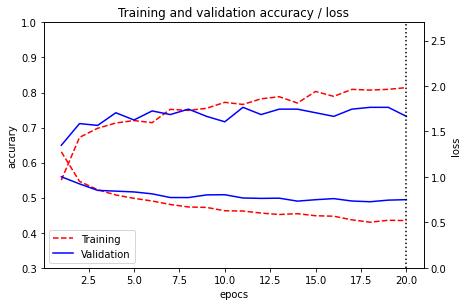

In [ ]:
#@title Doble clic para mostrar código. { display-mode: "form" }

import matplotlib.pyplot as plt

def show_accuracy(history):
  acc = history.history['accuracy']
  val_acc = history.history['val_accuracy']
  loss = history.history['loss']
  val_loss = history.history['val_loss']
  epochs = range(1, len(acc)+1)
  print("acc: ", acc)
  print("val_acc: ", val_acc)
  print("loss: ", loss)
  print("val_loss: ", val_loss)
  
  fig, ax1 = plt.subplots()
  fig.tight_layout()  # otherwise the right y-label is slightly clipped
  ax1.axis(ymin=0.3, ymax=1.0)
  ax1.set_xlabel('epocs')
  ax1.set_ylabel('accurary')
  ax1.plot(epochs, acc, 'r--', label='Training accuracy')
  ax1.plot(epochs, val_acc, 'b', label='Validation accuracy')
  ax2 = ax1.twinx() 
  ax2.set_ylabel('loss')
  ax2.axis(ymin=0.0, ymax=2.7)
  ax2.plot(epochs, loss, 'r--', label='Training')
  ax2.plot(epochs, val_loss, 'b', label='Validation')
  plt.title('Training and validation accuracy / loss')
  plt.legend(loc="lower left")#"best")#0
  plt.axvline(x=20, color='k', linestyle='dotted')
  plt.show()

show_accuracy(H)

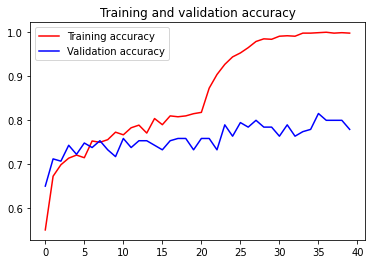

<Figure size 432x288 with 0 Axes>

In [ ]:
#@title Doble clic para mostrar código. { display-mode: "form" }

import matplotlib.pyplot as plt

def show_accuracy(history):
  acc = history.history['accuracy']
  val_acc = history.history['val_accuracy']
  #loss = history.history['loss']
  #val_loss = history.history['val_loss']
  epochs = range(len(acc))
  plt.plot(epochs, acc, 'r', label='Training accuracy')
  plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
  plt.title('Training and validation accuracy')
  plt.legend(loc=0)
  plt.figure()
  plt.show()

show_accuracy(H)

{'GAFAS': 0, 'LATERAL': 1, 'NARIZ': 2, 'OK': 3, 'PUENTE': 4, 'SIN': 5}


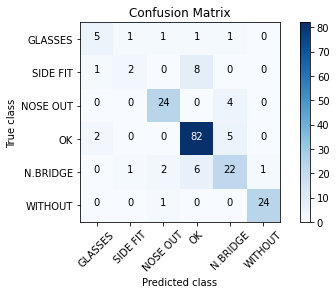

In [ ]:
#@title Doble clic para mostrar código. { display-mode: "form" }

from collections import Counter
from sklearn.metrics import confusion_matrix
import itertools
import numpy as np

def plot_confusion_matrix(cm, classes_map,
                          normalize=False,
                          title='Confusion Matrix',
                          cmap=plt.cm.Blues):
    """
    Esta función visualiza la matriz de confusión.
    Usa el parámetro `normalize=True` para normalizar los resultados.
    Note, this code is taken straight from the SKLEARN website, an nice way of viewing confusion matrix.
    """
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes_map))
    inv_map = {v: k for k, v in classes_map.items()}
    labels = inv_map.values()
    plt.xticks(tick_marks, labels, rotation=45)
    plt.yticks(tick_marks, labels)
    if normalize:
        cm = np.around(cm.astype('float') / cm.sum(axis=1)[:, np.newaxis], 2)
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")
    plt.tight_layout()
    plt.ylabel('True class')
    plt.xlabel('Predicted class')

"""
Obtener la matriz de confusión de un corpus creado desde un ImageDataGenerator 
es algo más complejo que el último ejemplo estudiado. El problema está en que las 
muestras son extraidas por lotes (bath) y la función 
confusion_matrix(validation_classes, y_pred) espera que sus dos parámetros sean 
vectores. Para resolverlo recorremos todos los lotes el generador y vamos 
concatenando los vectores adecuados.
Otra solución alternativa en:
https://stackoverflow.com/questions/47907061/how-to-get-confusion-matrix-when-using-model-fit-generator
"""
validation_classes = []
validation_images = []
for i in range( -(-validation_generator.samples // validation_generator.batch_size)):  # número de veces que podemos sacar batch redondeado hacia arriba
   batch = validation_generator.next()
   expected = np.argmax(batch[1], axis=1) 
   validation_classes.extend(expected)
   validation_images.extend(batch[0])
validation_classes = np.array(validation_classes)
validation_images = np.array(validation_images)
Y_pred = model.predict(validation_images)
y_pred = np.argmax(Y_pred, axis=1)
my_confussion = confusion_matrix(validation_classes, y_pred)
classes = {'GLASSES': 0, 'SIDE FIT': 1, 'NOSE OUT': 2, 'OK': 3, 'N.BRIDGE': 4, 'WITHOUT': 5}
plot_confusion_matrix(my_confussion, classes_map = classes)#validation_generator.class_indices)#, normalize=True)

## Fine-tuning of the entire model

In [ ]:
base_model.trainable = True

EPOCHS = 20
INIT_LR = 1e-5

model.compile(
    optimizer=keras.optimizers.Adam(
        learning_rate=INIT_LR, 
        decay=INIT_LR / EPOCHS),
    loss=keras.losses.categorical_crossentropy,
    metrics=["accuracy"],
)
H2 = model.fit(
    train_generator, 
    epochs=EPOCHS, 
    batch_size = BATCH_SIZE,
    validation_data=validation_generator,
    validation_batch_size = BATCH_SIZE,
)
#Concatenamos historia de entrenamiento
H.history['loss'] = H.history['loss'] + H2.history['loss']
H.history['accuracy'] = H.history['accuracy'] + H2.history['accuracy']
H.history['val_loss'] = H.history['val_loss'] + H2.history['val_loss']
H.history['val_accuracy'] = H.history['val_accuracy'] + H2.history['val_accuracy']

Epoch 1/20
31/31 [==============================] - 20s 468ms/step - loss: 0.4700 - accuracy: 0.8170 - val_loss: 0.6819 - val_accuracy: 0.7577
Epoch 2/20
31/31 [==============================] - 14s 436ms/step - loss: 0.3543 - accuracy: 0.8720 - val_loss: 0.6650 - val_accuracy: 0.7577
Epoch 3/20
31/31 [==============================] - 14s 438ms/step - loss: 0.2846 - accuracy: 0.9030 - val_loss: 0.6784 - val_accuracy: 0.7320
Epoch 4/20
31/31 [==============================] - 14s 437ms/step - loss: 0.2337 - accuracy: 0.9260 - val_loss: 0.6598 - val_accuracy: 0.7887
Epoch 5/20
31/31 [==============================] - 14s 438ms/step - loss: 0.1923 - accuracy: 0.9430 - val_loss: 0.6926 - val_accuracy: 0.7629
Epoch 6/20
31/31 [==============================] - 14s 435ms/step - loss: 0.1476 - accuracy: 0.9520 - val_loss: 0.6871 - val_accuracy: 0.7938
Epoch 7/20
31/31 [==============================] - 14s 432ms/step - loss: 0.1104 - accuracy: 0.9640 - val_loss: 0.7475 - val_accuracy: 0.7835

acc:  [0.550000011920929, 0.671999990940094, 0.6980000138282776, 0.7129999995231628, 0.7200000286102295, 0.7139999866485596, 0.7519999742507935, 0.7490000128746033, 0.7549999952316284, 0.7720000147819519, 0.765999972820282, 0.7820000052452087, 0.7879999876022339, 0.7699999809265137, 0.8029999732971191, 0.7889999747276306, 0.8090000152587891, 0.8069999814033508, 0.8090000152587891, 0.8140000104904175, 0.8169999718666077, 0.871999979019165, 0.902999997138977, 0.9259999990463257, 0.9430000185966492, 0.9520000219345093, 0.9639999866485596, 0.9779999852180481, 0.984000027179718, 0.9829999804496765, 0.9900000095367432, 0.9909999966621399, 0.9900000095367432, 0.996999979019165, 0.996999979019165, 0.9980000257492065, 0.9990000128746033, 0.996999979019165, 0.9980000257492065, 0.996999979019165]
val_acc:  [0.6494845151901245, 0.7113401889801025, 0.7061855792999268, 0.7422680258750916, 0.7216494679450989, 0.7474226951599121, 0.7371134161949158, 0.7525773048400879, 0.7319587469100952, 0.7164948582

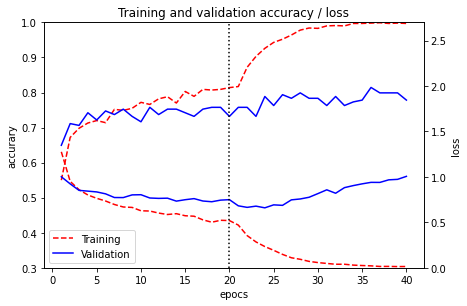

In [ ]:
show_accuracy(H)

              precision    recall  f1-score   support

     GLASSES       0.43      0.33      0.38         9
    SIDE FIT       0.27      0.27      0.27        11
    NOSE OUT       0.86      0.89      0.88        28
          OK       0.86      0.80      0.83        89
    N.BRIDGE       0.62      0.78      0.69        32
     WITHOUT       1.00      0.96      0.98        25

    accuracy                           0.78       194
   macro avg       0.67      0.67      0.67       194
weighted avg       0.78      0.78      0.78       194



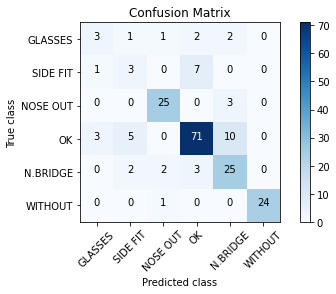

In [ ]:
#@title Doble clic para mostrar código. { display-mode: "form" }

from collections import Counter
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
import itertools
import numpy as np

def plot_confusion_matrix(cm, classes_map,
                          normalize=False,
                          title='Confusion Matrix',
                          cmap=plt.cm.Blues):
    """
    Esta función visualiza la matriz de confusión.
    Usa el parámetro `normalize=True` para normalizar los resultados.
    Note, this code is taken straight from the SKLEARN website, an nice way of viewing confusion matrix.
    """
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes_map))
    inv_map = {v: k for k, v in classes_map.items()}
    labels = inv_map.values()
    plt.xticks(tick_marks, labels, rotation=45)
    plt.yticks(tick_marks, labels)
    if normalize:
        cm = np.around(cm.astype('float') / cm.sum(axis=1)[:, np.newaxis], 2)
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")
    plt.tight_layout()
    plt.ylabel('True class')
    plt.xlabel('Predicted class')

"""
Obtener la matriz de confusión de un corpus creado desde un ImageDataGenerator 
es algo más complejo que el último ejemplo estudiado. El problema está en que las 
muestras son extraidas por lotes (bath) y la función 
confusion_matrix(validation_classes, y_pred) espera que sus dos parámetros sean 
vectores. Para resolverlo recorremos todos los lotes el generador y vamos 
concatenando los vectores adecuados.
Otra solución alternativa en:
https://stackoverflow.com/questions/47907061/how-to-get-confusion-matrix-when-using-model-fit-generator
"""
validation_classes = []
validation_images = []
for i in range( -(-validation_generator.samples // validation_generator.batch_size)):  # número de veces que podemos sacar batch redondeado hacia arriba
   batch = validation_generator.next()
   expected = np.argmax(batch[1], axis=1) 
   validation_classes.extend(expected)
   validation_images.extend(batch[0])
validation_classes = np.array(validation_classes)
validation_images = np.array(validation_images)
Y_pred = model.predict(validation_images)
y_pred = np.argmax(Y_pred, axis=1)


print(classification_report(validation_classes, y_pred, 
		target_names = ['GLASSES', 'SIDE FIT', 'NOSE OUT', 'OK', 'N.BRIDGE', 'WITHOUT']))

my_confussion = confusion_matrix(validation_classes, y_pred)
classes = {'GLASSES': 0, 'SIDE FIT': 1, 'NOSE OUT': 2, 'OK': 3, 'N.BRIDGE': 4, 'WITHOUT': 5}
plot_confusion_matrix(my_confussion, classes_map = classes)#validation_generator.class_indices)#, normalize=True)

Found 194 images belonging to 6 classes.


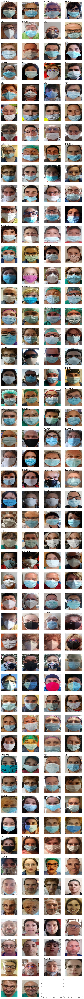

accuracy:  151 / 194  =  0.7783505154639175


In [ ]:
#@title Doble clic para mostrar código. { display-mode: "form" }
import numpy as np
from keras_preprocessing import image
from keras_preprocessing.image import ImageDataGenerator

NCOLS = 4 # número de columnas

#Visualiza los pimeros <number> imagenes, generadas desde datagen
#se clasifica cada imagen y en caso de error, se muestra la categoría asignada 
def show_generate_images(datagen, sample_number=None):
   if not isinstance(sample_number, (int) ): # Si no se indican cuantas 
      sample_number = datagen.samples        # se visualizan todas
   target_names = []                 # Obtenemos nombres de las clases 
   for key in datagen.class_indices:
      target_names.append(key)  
   nrows = -(-sample_number//NCOLS)  # número de filas (división entera redondeando hacia arriba)
   fig, ax = plt.subplots(nrows=nrows, ncols=NCOLS, figsize=(4*NCOLS,4*nrows))
   errors = 0
   i = 0
   for b in range( -(-sample_number // datagen.batch_size)):  # número de veces que podemos sacar batch redondeado hacia arriba
      x,y = datagen.next()
      for j in range(len(x)):
         if (i < sample_number):
            col = i % NCOLS
            row = i // NCOLS
            ax[row,col].axis('Off')  
            ax[row,col].imshow(x[j])
            y_pred = model.predict(x)[j]  # Verificamos error
            cat = np.argmax(y[j])
            cat_pred = np.argmax(y_pred) 
            if cat != cat_pred :
                ax[row,col].text(0, 0, target_names[cat_pred], fontsize=22)
                errors +=1
            i += 1
   plt.show()
   print("accuracy: ", sample_number-errors,"/",sample_number," = ", (sample_number-errors)/sample_number ) 

validation_generator = validation_datagen.flow_from_directory(
	  FOLDER+"/validation/",
    batch_size=BATCH_SIZE,
	  target_size=(IMG_SIZE),
    shuffle=False)
validation_generator.reset()
show_generate_images(validation_generator)
